# Analisi i predicció dels accidents de transit a Barcelona

In [3]:
# Import packages
import os
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix
%matplotlib inline
import folium

# Dataset de les Persones accidentades

In [4]:
### Carreguem el dataset dels accidents del 2017
data_path = os.path.join(os.getcwd(), 'persones','2017_accidents_persones_gu_bcn_.csv')
accidents_persona2017 = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

### Mirem quina forma té el dataset
print('DataSet Persones - Nombre instances: {}, number of Training attributes: {}'.format(accidents_persona2017.shape[0], accidents_persona2017.shape[1]))


DataSet Persones - Nombre instances: 12148, number of Training attributes: 28


In [5]:
### Com que el fitxer té noms differents pels atributs, canviem els noms a mà.
accidents_persona2017.rename(columns={'NÃºmero_d\'expedient':'Codi_expedient'}, inplace=True)
accidents_persona2017.rename(columns={'Nom carrer':'Nom_carrer'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_dia_setmana':'Descripcio_dia_setmana'}, inplace=True)
accidents_persona2017.rename(columns={'Dia setmana':'Dia_setmana'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ tipus dia':'Descripcio_tipus_dia'}, inplace=True)
accidents_persona2017.rename(columns={'NK Any':'NK_Any'}, inplace=True)
accidents_persona2017.rename(columns={'Nom mes':'Nom_mes'}, inplace=True)
accidents_persona2017.rename(columns={'Dia de mes':'Dia_de_mes'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ torn':'Descripcio_torn'}, inplace=True)
accidents_persona2017.rename(columns={'Hora de dia':'Hora_de_dia'}, inplace=True)
accidents_persona2017.rename(columns={'Desc._Tipus_vehicle_implicat':'Descripcio_tipus_de_vehicle'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³ causa vianant':'Descripcio_causa_vianant'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_sexe':'Descripcio_sexe'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_tipus_persona':'Descripcio_tipus_persona'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_situaciÃ³':'Descripcio_situacio'}, inplace=True)
accidents_persona2017.rename(columns={'DescripciÃ³_victimitzaciÃ³':'Descripcio_victimitzacio'}, inplace=True)
accidents_persona2017.rename(columns={'Long':'Longitud'}, inplace=True)
accidents_persona2017.rename(columns={'Lat':'Latitud'}, inplace=True)
accidents_persona2017.rename(columns={'Mes de any':'Mes_de_any'}, inplace=True)


In [6]:
### Fem neteja dels atributs, eliminant dades incorrectes.
accidents_persona2017 = accidents_persona2017[accidents_persona2017['Codi_districte'] > 0] #Eliminem els districtes -1
accidents_persona2017 = accidents_persona2017[accidents_persona2017['Codi_carrer'] > 0] #Eliminem els districtes -1

### Alguns agents de Guardia Urbana posaven Turismo i els altres Turisme... Ho hem passat tot a Turisme.
accidents_persona2017 = accidents_persona2017.replace({'Turismo': 'Turisme'}, regex=True)

### Seleccionar atributs d'especial interés per l'anàlisi.
atributs_selecionats = ['Codi_expedient', 'Descripcio_tipus_persona','Descripcio_tipus_de_vehicle','Descripcio_victimitzacio', 'Edat','Codi_barri','Codi_carrer','Hora_de_dia','Mes_de_any','Dia_de_mes','Longitud','Latitud' ]
copia_persones = accidents_persona2017[atributs_selecionats]


In [7]:
### Ja que volem saber si les persones van ser ferides lleus, greus o mortes, volem que els atributs 
### sigui tots iguals. Eliminant així els detall d'algunes entrades.
copia_persones = copia_persones.replace({'Ferit lleu: HospitalitzaciÃ³ fins a 24h':'Ferit lleu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit greu: hospitalitzaciÃ³ superior a 24h':'Ferit greu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit greu: hospitalitzaciÃ³ superior a 24h':'Ferit greu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit lleu: Amb assistÃ¨ncia sanitÃ\xa0ria en lloc d\'accident':'Ferit lleu'}, regex=True)
copia_persones = copia_persones.replace({'Ferit lleu: Rebutja assistÃ¨ncia sanitÃ\xa0ria':'Ferit lleu'}, regex=True)
copia_persones['Descripcio_victimitzacio'] = copia_persones['Descripcio_victimitzacio'].replace("Mort (dins 24h posteriors accident)"
                                                                                                , "Mort")
### Perquè els canvis posteriors no afectin a tots els altres dataframes, en fem una copia.
dummy_persones = copia_persones.copy()                                          

### Fer binaries les variables dels ferits. One-Hot Econding.
dummy_persones = pd.concat([copia_persones, pd.get_dummies(copia_persones['Descripcio_victimitzacio'])], axis=1)

### Finalment posar el mateix nom de les columnes tant a Persones com a Accidents 
### (dataframe que veurem a continuació).
dummy_persones.rename(columns={'Ferit greu':'Num_Greus'}, inplace=True)
dummy_persones.rename(columns={'Ferit lleu':'Num_Lleus'}, inplace=True)
dummy_persones.rename(columns={'Mort':'Num_Morts'}, inplace=True)

dummy_persones


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,Longitud,Latitud,Num_Greus,Num_Lleus,Num_Morts
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,2.14816,41.399482,0,1,0
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,2.185284,41.396355,0,1,0
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,2.180756,41.402529,0,1,0
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,2.191008,41.396801,0,1,0
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,2.191008,41.396801,0,1,0
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,2.166257,41.38468,0,1,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,2.163892,41.394706,0,1,0
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,2.163892,41.394706,0,1,0
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,2.139199,41.3805,0,1,0
9,2017S000010,Passatger,AutobÃºs,Ferit lleu,91,62,133300,12,1,1,2.180191,41.421792,0,1,0


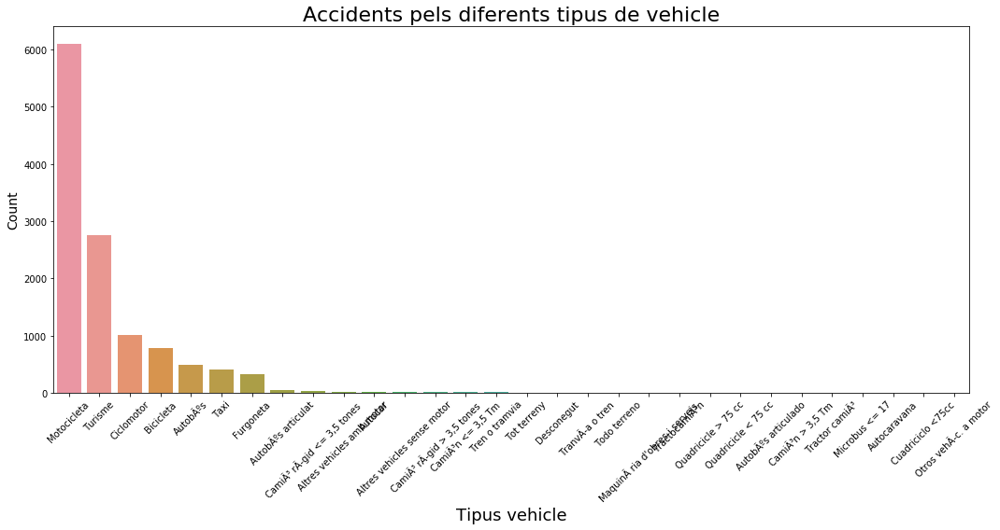

In [8]:
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.countplot(x=dummy_persones["Descripcio_tipus_de_vehicle"], 
                   ax=ax,
                   order = dummy_persones["Descripcio_tipus_de_vehicle"].value_counts().index )

plt.xticks(rotation=45)
plt.xlabel('Tipus vehicle', fontsize=18)
plt.ylabel('Count', fontsize=14)
plt.title('Accidents pels diferents tipus de vehicle', fontsize=22)
plt.tight_layout()
plt.show()

* Com podem veure en el gràfic anterior, la majoria de vehicles accidentats són motocicletes.
* Es podrien reduir a 7 els tipus de vehicles accidentats a Barcelona sense perdre massa variança de les dades.

In [9]:
### Selecionem només fins a furgonetes.
select_vehicles = dummy_persones["Descripcio_tipus_de_vehicle"].value_counts().iloc[:7].index
dummy_persones = dummy_persones[dummy_persones["Descripcio_tipus_de_vehicle"].isin(select_vehicles)]

### Canviar les cel·les on Autobús està corromput.
dummy_persones = dummy_persones.replace({'AutobÃºs': 'Autobus'}, regex=True)

### Finalment també fem One Hot Encoding amb el tipus de vehicle accidentat.
dummy_persones = pd.concat([dummy_persones, pd.get_dummies(dummy_persones['Descripcio_tipus_de_vehicle'])], axis=1)

print('DataSet Persones accidentades - Nombre instances: {}, number of Training attributes: {}'.format(dummy_persones.shape[0], dummy_persones.shape[1]))
dummy_persones

DataSet Persones accidentades - Nombre instances: 11868, number of Training attributes: 22


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Greus,Num_Lleus,Num_Morts,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,1,0,0,0,0,0,0,0,1
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,1,0,0,0,0,0,1,0,0
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,1,0,0,0,0,0,1,0,0
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,1,0,0,0,1,0,0,0,0
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,1,0,0,0,1,0,0,0,0
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,1,0,0,1,0,0,0,0,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,1,0,0,0,0,0,1,0,0
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,1,0,0,0,0,0,1,0,0
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,1,0,0,0,1,0,0,0,0
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,1,0,1,0,0,0,0,0,0


# Dataset Accidents

In [10]:
### Fem el mateix amb els ferits/accidentats l'any 2017.

### Lleguim el dataframe.
data_path = os.path.join(os.getcwd(), 'accidents_ferits','2017_accidents_gu_bcn.csv')
accidents_ferits = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
print('DataSet Accidents - Nombre instances: {}, number of Training attributes: {}'.format(accidents_ferits.shape[0], accidents_ferits.shape[1]))

### Eliminem els districtes -1
accidents_ferits = accidents_ferits[accidents_ferits['Codi districte'] > -1] 

DataSet Accidents - Nombre instances: 10339, number of Training attributes: 27


In [11]:
### Canviem el nom dels atributs per fer-los lleguibles.
accidents_ferits.rename(columns={'NÃºmero d\'expedient':'Codi_expedient'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de morts':'Num_Morts'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de lesionats lleus':'Num_Lleus'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de lesionats greus':'Num_Greus'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de vÃ­ctimes':'Num_Victimes'}, inplace=True)
accidents_ferits.rename(columns={'NÃºmero de vehicles implicats':'Num_Vehicles_Implicats'}, inplace=True)
accidents_ferits.rename(columns={'Dia setmana':'Dia_setmana'}, inplace=True)

### I per conveniència passem els valors numerics a enters.
accidents_ferits['Num_Morts'] = pd.to_numeric(accidents_ferits['Num_Morts'])
accidents_ferits['Num_Lleus'] = pd.to_numeric(accidents_ferits['Num_Lleus'])
accidents_ferits['Num_Greus'] = pd.to_numeric(accidents_ferits['Num_Greus'])
accidents_ferits['Num_Vehicles_Implicats'] = pd.to_numeric(accidents_ferits['Num_Vehicles_Implicats'])

### Mostrem per pantalla.
accidents_ferits

,Codi_expedient,Codi districte,Nom districte,Codi barri,Nom barri,Codi carrer,Nom carrer,Num postal caption,DescripciÃ³ dia setmana,Dia_setmana,...,DescripciÃ³ causa vianant,Num_Morts,Num_Lleus,Num_Greus,Num_Victimes,Num_Vehicles_Implicats,Coordenada UTM (X),Coordenada UTM (Y),Longitud,Latitud
4,2017S004615,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,226400,Las Navas de Tolosa ...,0323 0325,Dijous,Dj,...,No Ã©s causa del vianant,0,1,0,1,3,"432006,95","4585503,52",2.185272,41.416365
5,2017S007775,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria / Trinxant ...,0320 0322,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,2,"431822,92","4585470,94",2.183245,41.416336
6,2017S004484,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,Trinxant / IndÃºstria ...,0320 0322,Dissabte,Ds,...,No Ã©s causa del vianant,0,1,0,1,2,"431822,92","4585470,94",2.183245,41.416336
7,2017S010680,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0303 0303,Dimarts,Dm,...,No Ã©s causa del vianant,0,2,0,2,1,"431846,11","4585523,10",2.183561,41.416372
8,2017S005152,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0317 0317,Dilluns,Dl,...,Altres,0,1,0,1,1,"431894,47","4585568,41",2.184059,41.416763
9,2017S003932,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,194406,Maragall ...,0011 0011,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,1,"431636,55","4585227,81",2.181225,41.413958
10,2017S010348,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,161407,IndÃºstria ...,0295 0295,Dijous,Dj,...,No Ã©s causa del vianant,0,1,0,1,2,"431757,04","4585439,98",2.182290,41.415772
11,2017S000245,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,224802,ST ANTONI M CLARET / Pg Maragall ...,0092 0092,Dimecres,Dc,...,No Ã©s causa del vianant,0,1,0,1,2,"431715,17","4585325,84",2.180453,41.415790
12,2017S005695,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,297001,Sant Antoni Maria Claret / GuinardÃ³ ...,0358 0358,Divendres,Dv,...,No Ã©s causa del vianant,0,1,0,1,2,"431690,10","4585511,58",2.181140,41.416295
13,2017S007384,10,Sant MartÃ­,64,el Camp de l'Arpa del Clot,297001,Sant Antoni Maria Claret ...,0258 0260,Dilluns,Dl,...,No Ã©s causa del vianant,0,0,1,1,2,"431235,61","4585067,59",2.176324,41.412546


In [12]:
### Seleccionem els atributs que ens interessen. Al tenir ja el dummy a les persones no ens caldrà aquí.
atributs_seleccionats =['Codi_expedient','Num_Victimes','Num_Vehicles_Implicats']
copia_accidents = accidents_ferits[atributs_seleccionats]
copia_accidents

,Codi_expedient,Num_Victimes,Num_Vehicles_Implicats
4,2017S004615,1,3
5,2017S007775,1,2
6,2017S004484,1,2
7,2017S010680,2,1
8,2017S005152,1,1
9,2017S003932,1,1
10,2017S010348,1,2
11,2017S000245,1,2
12,2017S005695,1,2
13,2017S007384,1,2


In [13]:
### Join dels Dataframe persones_dummy i Accidents
persones_accidentades = pd.merge(dummy_persones, copia_accidents, on = ['Codi_expedient'])
persones_accidentades

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Morts,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,0,0,1,1,1
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,0,0,1,0,0,1,2
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,0,0,1,0,0,1,2
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,0,1,0,0,0,0,2,3
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,0,1,0,0,0,0,2,3
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,0,1,0,0,0,0,0,1,1
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,0,0,1,0,0,2,2
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,0,0,1,0,0,2,2
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,0,1,0,0,0,0,1,2
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,1,0,0,0,0,0,0,1,1


# Visualització dels accidents de la ciutat de Barcelona

* Note: Es necesita internet per renderitzar els mapes.

In [14]:
### Fem una copia de les dades, per evitar així alteracions.
persones_accidentades2 = persones_accidentades.copy()

### Passar les dades de les coordenades a numeric.
persones_accidentades2['Latitud'] = pd.to_numeric(persones_accidentades2['Latitud'])
persones_accidentades2['Longitud'] = pd.to_numeric(persones_accidentades2['Longitud'])
                                           
### Assegurar-nos que no sens hagi escapat cap error.    
df_accidents = persones_accidentades2[persones_accidentades2["Latitud"] > 0]
df_accidents = persones_accidentades2[persones_accidentades2["Longitud"] > 0]

### On serà ubicada la primera pàgina del mapa.
location = df_accidents['Latitud'].mean(), df_accidents['Longitud'].mean()

### Arrodonir els decimals per simplicitat.
lat_list = df_accidents["Latitud"].values.tolist()
long_list = df_accidents["Longitud"].values.tolist()

long_list =np.round(long_list,7)
lat_list = np.round(lat_list,7)

labels = persones_accidentades2["Descripcio_tipus_de_vehicle"].values.tolist()

### Crear un mapa de calor de tots els accidents que han tingut lloc a Barcelona el 2017.
from folium.plugins import MarkerCluster
from folium import plugins

### Definim la vista predefinida al iniciar el mapa.
myMap = folium.Map(location=[lat_list.mean(),long_list.mean()], zoom_start=12)

marker_cluster = MarkerCluster().add_to(myMap)

for i in range(0,len(lat_list)):
    popup = folium.Popup(labels[i], parse_html=True)
    folium.Marker(location=[lat_list[i], long_list[i]], 
                  popup=popup).add_to(marker_cluster)
    
# Convert to (n, 2) nd-array format for heatmap
matrix_loc = df_accidents[['Latitud', 'Longitud']].values

# Plot heatmap
myMap.add_child(plugins.HeatMap(matrix_loc, radius=15))

#Save map as .html
                            ### myMap.save('Mapa_accidents_Bcn_2017.html')
myMap ### Mostrar per pantalla.

# Densitat de població

In [15]:
### Ara d'afegir més atributs a les nostres dades. Començem amb la densitat de la població.
data_path = os.path.join(os.getcwd(), 'densitat_poblacio','2017_padro_ocupacio_mitjana.csv')
densitat_pobl = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

densitat_pobl.rename(columns={'PoblaciÃ³':'Poblacio'}, inplace=True)
densitat_pobl.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)

select_atributs = ['Codi_barri','Poblacio']
densitat_pobl = densitat_pobl[select_atributs]

persones_accidentades2 = pd.merge(persones_accidentades2, densitat_pobl, on = ['Codi_barri'], how='left')
persones_accidentades2

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Autobus,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,0,1,1,1,47753
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,0,1,0,0,1,2,32048
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,0,1,0,0,1,2,51651
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,1,0,0,0,0,2,3,15204
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,1,0,0,0,0,2,3,15204
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,1,0,0,0,0,0,1,1,47986
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,0,1,0,0,2,2,44246
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,0,1,0,0,2,2,44246
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,1,0,0,0,0,1,2,41244
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,0,0,0,0,0,0,1,1,14141


# Parc automobilistic

In [16]:
### Obrim la tipologia del parc de vehicles de Barcelona, on hi ha més motocicletes, cotxes...
data_path = os.path.join(os.getcwd(), 'parc_auto','2017_tipologia_parc_vehicles.csv')
parc_auto = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')

### Esborrem codis d'error
parc_auto = parc_auto[parc_auto['Codi_Districte']<11]

##Selccionem atributs que ens interessen
select_colums = ['Codi_Barri','Nombre_vehicles','Tipologia_parc']
parc_auto = parc_auto[select_colums]

### Les agrupem per tipus de vehicle
parc_groupby = parc_auto.groupby(['Codi_Barri','Tipologia_parc'],as_index=False).sum()

### Noms amb coherència amb les dades anteriors.
parc_groupby.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)
parc_groupby.rename(columns={'Tipologia_parc':'Descripcio_tipus_de_vehicle'}, inplace=True)
parc_groupby.rename(columns={'Nombre_vehicles':'Nombre_vehicles_parc'}, inplace=True)

### En aquest cas les dades del dataframe per ajustar-se a les que ja tenim.
parc_groupby = parc_groupby.replace({'Turismes': 'Turisme'}, regex=True)
parc_groupby = parc_groupby.replace({'Motos': 'Motocicleta'}, regex=True)
parc_groupby = parc_groupby.replace({'Ciclomotors': 'Ciclomotor'}, regex=True)
parc_groupby = parc_groupby.replace({'Furgonetes': 'Furgoneta'}, regex=True)

### Left join per ajuntarho amb dades anteriors.
persones_accidentades3 = pd.merge(persones_accidentades2, parc_groupby, on = ['Codi_barri','Descripcio_tipus_de_vehicle'], how='left')

### Omplir el nomber de vehicles al parc amb 0, ja que no tenim dades.
persones_accidentades3['Nombre_vehicles_parc'] = persones_accidentades3['Nombre_vehicles_parc'].fillna(0)

## Passem el nombre de vehicles a enter
persones_accidentades3["Nombre_vehicles_parc"] = persones_accidentades3["Nombre_vehicles_parc"].astype(int)

persones_accidentades3


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Bicicleta,Ciclomotor,Furgoneta,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,0,0,0,1,1,1,47753,26740
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,0,0,0,1,0,0,1,2,32048,4284
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,0,0,0,1,0,0,1,2,51651,6904
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,1,0,0,0,0,2,3,15204,504
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,1,0,0,0,0,2,3,15204,504
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,0,0,0,0,0,1,1,47986,0
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,0,0,0,1,0,0,2,2,44246,9007
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,0,0,0,1,0,0,2,2,44246,9007
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,1,0,0,0,0,1,2,41244,1432
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,0,0,0,0,0,1,1,14141,0


# Sortides i postes de Sol

In [17]:
### Lleguim dataframe.
data_path = os.path.join(os.getcwd(), 'sortida_posta_sol','sortida_posta_2017.csv')
sortida_posta_sol = pd.read_csv(data_path, delimiter = ';', encoding='latin-1')

### Netejem i treiem les columnes que no ens interessen.
sortida_posta_sol["salida"] = sortida_posta_sol["salida"].str.replace(":",".").astype(float)
sortida_posta_sol["puesta"] = sortida_posta_sol["puesta"].str.replace(":",".").astype(float)
sortida_posta_sol.drop(['cenit'], axis=1, inplace=True)

### Arrodonim totes les hores cap aball, ja que els accidents les hores també són int.
sortida_posta_sol = sortida_posta_sol.astype(int)

### Posem el mateix nom a les columnes que volem fer el join
sortida_posta_sol.rename(columns={'dia':'Dia_de_mes'}, inplace=True)
sortida_posta_sol.rename(columns={'mes':'Mes_de_any'}, inplace=True)
sortida_posta_sol.rename(columns={'any':'Any'}, inplace=True)
sortida_posta_sol.rename(columns={'salida':'Sortida_Sol'}, inplace=True)
sortida_posta_sol.rename(columns={'puesta':'Posta_Sol'}, inplace=True)

sortida_posta_sol

,Dia_de_mes,Mes_de_any,Any,Sortida_Sol,Posta_Sol
0,1,1,2017,8,17
1,2,1,2017,8,17
2,3,1,2017,8,17
3,4,1,2017,8,17
4,5,1,2017,8,17
5,6,1,2017,8,17
6,7,1,2017,8,17
7,8,1,2017,8,17
8,9,1,2017,8,17
9,10,1,2017,8,17


In [18]:
### Left join per ajuntarho amb dades anteriors.
persones_accidentades4 = pd.merge(persones_accidentades3, sortida_posta_sol, on = ['Dia_de_mes','Mes_de_any'], how='left')
persones_accidentades4

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Motocicleta,Taxi,Turisme,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,0,0,1,1,1,47753,26740,2017,8,17
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,1,0,0,1,2,32048,4284,2017,8,17
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,0,0,1,2,51651,6904,2017,8,17
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,0,0,0,2,3,15204,504,2017,8,17
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,0,0,0,2,3,15204,504,2017,8,17
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,0,0,0,1,1,47986,0,2017,8,17
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,1,0,0,2,2,44246,9007,2017,8,17
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,1,0,0,2,2,44246,9007,2017,8,17
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,0,0,0,1,2,41244,1432,2017,8,17
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,0,0,0,1,1,14141,0,2017,8,17


In [19]:
### Ara creerem una columna per veure la diferencia entre la hora que va passar l'accident 
### i la sortida o posata de sol.

persones_accidentades4['Dif_Sortida_Sol'] = abs(persones_accidentades4['Hora_de_dia'] - persones_accidentades4['Sortida_Sol'])
persones_accidentades4['Dif_Posta_Sol'] = abs(persones_accidentades4['Hora_de_dia'] - persones_accidentades4['Posta_Sol'])
persones_accidentades4['Dif_PostaoSortida_Sol'] = persones_accidentades4[["Dif_Sortida_Sol", "Dif_Posta_Sol"]].min(axis=1)
persones_accidentades4

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Victimes,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,1,1,47753,26740,2017,8,17,4,13,4
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,1,2,32048,4284,2017,8,17,6,15,6
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,1,2,51651,6904,2017,8,17,1,10,1
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,2,3,15204,504,2017,8,17,1,10,1
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,2,3,15204,504,2017,8,17,1,10,1
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,1,47986,0,2017,8,17,3,6,3
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,2,2,44246,9007,2017,8,17,2,7,2
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,2,2,44246,9007,2017,8,17,2,7,2
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,1,2,41244,1432,2017,8,17,6,3,3
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,1,14141,0,2017,8,17,4,5,4


# Densitat de semàfors als barris

In [44]:
### Ara farem el mateix però amb les coordenades del samafor més proper.
### Lleguim dataframe.
data_path = os.path.join(os.getcwd(), 'semafors_loc','Infraestructures_Inventari_Semafors.csv')
semafors_loc = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
semafors = semafors_loc.copy()

### Seleccionem els atributs que ens interessen
semafors_select = ['ID_Semafor','Codi_Barri','Longitud','Latitud']
semafors_loc = semafors_loc[semafors_select]
semafors_loc.dropna(inplace=True)
semafors_loc.rename(columns={'Codi_Barri':'Codi_barri'}, inplace=True)

densitat_semf_barri = semafors_loc.groupby(['Codi_barri'])["Codi_barri"].count().reset_index(name="Num_Semaf_Barri")
densitat_semf_barri

semafors

,ID_Semafor,Codi_Semafor,Codi_Districte,Nom_Districte,Codi_Barri,Nom_Barri,Longitud,Latitud,X_ETRS89,Y_ETRS89,Data_Alta
0,415227,ArmarioSim,NaN,NaN,NaN,NaN,2.094896,41.375543,424312.672,4580842.381,1900/01/01
1,415228,ArmarioSim,NaN,NaN,NaN,NaN,2.091653,41.369542,424034.492,4580179.061,1900/01/01
2,415229,ArmarioSim,NaN,NaN,NaN,NaN,2.089232,41.355098,423815.166,4578577.595,1900/01/01
3,415242,ArmarioSim,NaN,NaN,NaN,NaN,2.225559,41.418246,435281.562,4585477.333,1900/01/01
4,415243,ArmarioSim,NaN,NaN,NaN,NaN,2.220889,41.421307,434894.303,4585820.716,1900/01/01
5,415244,ArmarioSim,NaN,NaN,NaN,NaN,2.216116,41.425128,434499.275,4586248.480,1900/01/01
6,415245,ArmarioSim,NaN,NaN,NaN,NaN,2.210935,41.432734,434074.096,4587096.885,1900/01/01
7,415269,Col2400,NaN,NaN,NaN,NaN,2.095407,41.376060,424355.992,4580899.381,1900/01/01
8,415270,Col2400,NaN,NaN,NaN,NaN,2.090354,41.367153,423923.072,4579914.951,1900/01/01
9,415271,Col2400,NaN,NaN,NaN,NaN,2.088800,41.360935,423785.832,4579226.071,1900/01/01


In [25]:
### Ho afegim al nostre dataframe
### Left join per ajuntarho amb dades anteriors.

persones_accidentades5 = pd.merge(persones_accidentades4, densitat_semf_barri, on = ['Codi_barri'], how='left')
persones_accidentades5


,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Num_Vehicles_Implicats,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol,Num_Semaf_Barri
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,1,47753,26740,2017,8,17,4,13,4,3620
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,2,32048,4284,2017,8,17,6,15,6,2929
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,2,51651,6904,2017,8,17,1,10,1,3058
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,3,15204,504,2017,8,17,1,10,1,3594
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,3,15204,504,2017,8,17,1,10,1,3594
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,1,47986,0,2017,8,17,3,6,3,967
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,2,44246,9007,2017,8,17,2,7,2,8472
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,2,44246,9007,2017,8,17,2,7,2,8472
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,2,41244,1432,2017,8,17,6,3,3,1462
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,1,14141,0,2017,8,17,4,5,4,811


# Distància entre accident i semafors

In [26]:
### Arrodonim la seva localització perquè els semafors propers contin com a un. 
### Ho arrodonim a 4 decimals perquè els semafors propers tinguin les mateixes coordenades i per tant reduim així
### el nombre de semàfors amb els que compararem la distància.
semafors_loc['Latitud'] = semafors_loc['Latitud'].round(decimals=4)
semafors_loc['Longitud'] = semafors_loc['Longitud'].round(decimals=4)

### Agrupem tots aquells semadors que estan a la mateixa ubicació
semafors_loc_simpli = semafors_loc.groupby(['Longitud','Latitud','Codi_barri'],as_index=False).count()

### Ajustem els atributs perquè siguin després similars amb l'altre Dataframe.
semafors_loc_simpli.rename(columns={'ID_Semafor':'Count_Semafor'}, inplace=True)
semafors_loc_simpli['Codi_barri'] = semafors_loc_simpli['Codi_barri'].astype('int64')

### Finalment, per si de cas encara quedes algun duplicat, l'esborrem.
semafors_loc_simpli.drop_duplicates(subset=['Longitud', 'Latitud'], keep='first', inplace=True)


semafors_loc_simpli


,Longitud,Latitud,Codi_barri,Count_Semafor
0,2.0953,41.4214,22,2
1,2.0954,41.4215,22,1
2,2.0966,41.4199,22,1
3,2.0966,41.4200,22,3
4,2.0967,41.4200,22,5
5,2.0968,41.4198,22,1
6,2.0968,41.4200,22,3
7,2.0969,41.4198,22,3
8,2.0970,41.4195,22,6
9,2.0970,41.4196,22,3


### Ara ho fem amb els accidents

In [27]:
### Seleccionem els atributs que ens interessen.
selecionar_col = ['Longitud','Latitud','Codi_barri']
accidents_loc = persones_accidentades5[selecionar_col]

### Com abans també modifiquem els etributs perquè siguin semblants.
accidents_loc = accidents_loc.astype(float)
accidents_loc['Codi_barri'] = accidents_loc['Codi_barri'].astype('int64')

### Ja que un codi d'accident té diferents cotxes amb la mateixa localització, esborrem els valors repetits 
### i només deixem el primer.
accidents_loc.drop_duplicates(subset=['Longitud', 'Latitud'], keep='first', inplace=True)
accidents_loc

### Adequem les dades perquè tinguin els mateixos noms.
accidents_loc.rename(columns={'Latitud':'Latitud_acc'}, inplace=True)
accidents_loc.rename(columns={'Longitud':'Longitud_acc'}, inplace=True)
accidents_loc['Dist_semaf'] = 0

accidents_loc



,Longitud_acc,Latitud_acc,Codi_barri,Dist_semaf
0,2.148160,41.399482,26,0
1,2.185284,41.396355,5,0
2,2.180756,41.402529,6,0
3,2.191008,41.396801,66,0
5,2.166257,41.384680,1,0
6,2.163892,41.394706,7,0
8,2.139199,41.380500,18,0
9,2.180191,41.421792,62,0
10,2.199915,41.391332,67,0
11,2.182109,41.401530,5,0


In [35]:
### Amb aquest codi hem calculat la distància geodesica entre cada accident i semàfor.

### Un nested for loop per anar passant per les coordenades de semàfors i accidents.
for i in range(len(accidents_loc)):
    distancia = []
    
    for j in range(len(semafors_loc_simpli)):
        if accidents_loc.iloc[i,2] == semafors_loc_simpli.iloc[j,2]:
            num = geopy.distance.geodesic(accidents_loc.iloc[i,0:2], semafors_loc_simpli.iloc[j,0:2]).km
            distancia.append(num)           
    print(min(distancia))    
    accidents_loc.iloc[i,3] = min(distancia)
    
# ################################ prova1.to_csv('Distanca_accidents.csv')

    
# # Una línia ortodròmica o ortodròmia[1] és el camí més curt 
# # entre dos punts de la superfície terrestre, és l'arc de cercle màxim, 
# # menor de 180 graus, que els uneix.
# ### Wikipedia

0.11434589278757543
0.0318000117626913
0.017774081615051108
0.03418702929884809
0.03177863852250093
0.010493971390291087
0.10208279004357071
0.10120356584293538
0.03663852268441575
0.007850088478232183
0.0384946085653914
0.04905854704372266
0.055473372999314555
0.0338820580618316
0.010680435856206335
0.05406551648193972
0.10473075430928105
0.0032006320819435914
0.11369998882252501
0.28812102241423665
0.027091049372771778
0.10056985678694784
0.06306684471011105
0.0158586075719507
0.2901766486972882
0.10236314277787661
0.014611677707425802
0.11882429959940653
0.018477202492699414
0.035920294673969934
0.021327711860521893
0.07300544618017935
0.20374723447317797
0.11671274688219836
0.19361684126455103
0.1465848033020939
0.4986086953875502
0.005718870568553294
0.11857915677553663
0.0271078089562132
0.06539300009672876
0.1364558629016539
0.0629838056154134
0.010624147267145204
0.015002071810579502
0.03667409528227367
0.005180674552745072
0.11256672190804123
0.02228252379101001
0.071688209421

0.031103961396576407
0.01970795170720939
1.707218567556972
0.10613428089570112
0.025589600261124237
1.526351316317612
0.1566755364222356
0.13738010625546862
0.011992660207190028
0.059833933101314005
0.11659253827851522
0.007138202360208944
0.029395492582283193
0.0356997489151912
0.029188233098023635
0.23810281311633008
0.012875448896576611
0.002663129981514181
0.009035738260826308
0.15882532756688728
0.04436177472940953
0.09224242543343505
0.2014405772280077
0.023044393757818686
0.014245354515478814
0.016637042433466698
0.012171647463891508
0.2364469474104055
0.3441645240407731
0.3881744556625111
0.06509294765767788
0.16730870224585107
0.02668316289750363
0.23460487227223945
0.1558565177389107
0.013413708003198034
0.03365943817756535
0.1871167416645345
0.16119737799330852
0.01944156012922734
0.11953682094645462
0.09639706441706808
0.3280517280751311
0.01581860826040739
0.02193313325600167
0.12659587192081795
0.10858595526931242
0.03613071661598895
0.01238564235386356
0.0124448041061629

0.05573410427106324
0.11963727045449389
0.03043414252337959
0.38835851196791527
0.04636476891389334
0.0423159605389312
0.031649451738997914
0.07232870362365347
0.042555422440757815
0.04328561526303939
0.02332649031068369
0.1451729059766408
0.004754638467712748
0.11215291859654475
0.0009549928281675731
0.02720023006451622
0.15927628028466623
0.02202259335908814
0.003664231636753512
0.021067733698712964
0.018806030778057183
0.021593183627513557
2.482726524003243
0.24280030191295307
0.01731757268759926
0.011853735845779124
0.05447038749750082
0.05753305988908319
0.3704582735149129
0.059675405540007456
0.16041637017619834
0.24600889005045462
0.022196331503125222
0.07098889258998808
0.4472771399003271
0.1259032867428429
0.020754277826945507
0.1417241445752622
0.09309784437543107
0.07485612946940633
0.027842221492205315
0.030106319833930258
0.05943545959378009
0.4428317469059111
0.015629655183599604
0.014161497873541129
0.09738694236835056
0.05976686494668104
0.05536722459875194
0.0067597871

0.26956146592557695
0.009839884336358124
0.007776680715914844
0.044397626178717106
0.1493837301060314
0.019320265004618233
0.006124833087397903
0.012974077497961449
0.04171972864458577
0.046537207076703314
0.07340045169609044
0.04696416755534935
0.017009436552127964
0.050460122334324176
0.006998179869590145
0.0833240358034875
0.010447310617454412
0.039313761930309436
0.048051229645129874
0.2464058160640632
0.029370535225557805
0.02000517871632723
0.4189709017281721
0.10161219883879999
0.08576544703345092
0.08859456855196964
0.03527610537459444
0.038095517663317646
0.06721172823461373
0.1092445826523312
0.22509588314965762
0.32084990236376615
0.03468228867653367
0.04002314846575762
0.003994261776300694
0.028129078704925665
0.057705774058640615
0.13934884504835404
0.05113132629793114
0.09805567818039901
0.13811223973726974
0.0630784189758441
0.004074993414977316
0.015551456604708453
0.06211139306323936
0.05556491108654725
0.07319270193440065
0.14526480569401043
0.09518010567691866
0.0601

0.03535760390286334
0.0215763523972553
0.0008094696465334982
0.19918480600042648
0.01898157268779096
0.10615960105522641
0.47728964193738566
0.12264990340764806
0.10704920255630489
0.04396234665386352
0.05313292613718384
0.019193416000167014
0.21773704904789887
0.0036863203072161517
0.10133869059724297
0.15893587869674589
0.06995076078503727
0.5838756289125812
0.07682657446515256
0.01025759286550052
0.14659250212344893
0.13359674628635274
0.12288973929361392
0.08167479105608025
0.10041830836702917
0.13112281495309117
0.14131558962136828
0.003192545606103015
0.03408970356711189
0.08468774023645245
0.07463197415738741
0.016549744653647135
0.006372780435741824
0.113856193038737
0.08142668362155758
0.040261862232246474
0.07568136094414087
0.004437487569259348
0.13282571813464777
0.00657412813562095
0.033711918042118406
0.006420505640277011
0.10009585347774025
0.18135663113521408
0.04736771500228193
0.02079111858189369
0.064554264011778
0.0021475450111514915
0.021065105879745145
0.166540709

0.015127021108494074
0.008702848579921879
0.008171348132508915
0.019934329647740858
0.007215910153579031
0.020346248663410716
0.016188113335291857
0.0063643195312289465
0.059279297955617045
0.010615865915708893
0.00790248985853265
0.024542664104141895
0.008299287024467942
0.10972898860566503
0.007629233054800822
0.05462033452308576
0.0018885982325916035
0.07677925920220507
0.016689665855991086
0.02158951349109591
0.0840751853381387
0.008054136534485562
0.016274857065016045
0.005554670235439785
0.02070303579742941
0.01051280196143281
0.01072513373723766
0.11001683877988075
0.1772828822631495
0.1740506880594825
0.035990214605197364
0.00547628100938061
0.022140880716527138
0.19520477987428927
0.013830701385324504
0.005319568514178123
0.010340876321941871
0.07853286482639889
0.040783455087814224
0.0021733192978023114
0.003609934378627985
0.15451535641492437
0.15587957235311645
0.09451133750375447
0.0026561507255006916
0.16657944599737048
0.0070468413001371615
0.00549685873547504
0.00779305

0.17607087648682887
0.02328646348502007
0.027283700327123874
0.05953024913422585
0.045223799126341294
0.12512432589028286
1.6891299134796427
0.01386948843173994
0.021721968078897654
0.030032860679849057
0.061868010973662756
0.37562220738570823
0.018115346574124985
0.00497614150760431
0.012112694941876894
0.030318208344475937
0.007794764129895557
0.08243783424256101
0.009028565241402412
0.00567277771923618
0.004898853650861278
0.01581687730629298
0.009884566609106617
0.0242083629769918
0.021915628045491395
0.15655885474870235
0.016979087404380956
0.017114774015060327
0.1294837411048186
0.0038758621443541084
0.009781673544083049
0.008784605142584162
0.14925011633819518
0.0022247684843690334
0.1883001951176821
0.006365717926451722
0.018933887173872357
0.005610418539404344
0.03604437655578898
0.018846548132092
0.06324688311496372
0.03601237915301349
0.04645944484019412
0.06919637506944143
0.6369019972509771
0.04476153051529662
0.1177127712741915
0.006362834870263685
0.025890902534409756
0.

0.03129106597640769
0.008927517438209272
0.15613737411722853
0.0034202123679068753
0.05473147576868857
0.030445347549531817
0.004705484907122787
0.12156651805751553
0.0071091940355453844
0.05002979255244469
0.002200554097522007
0.018842971579182872
0.007791732002287101
0.003390470275914263
0.11410919302316529
0.04038094140552251
0.01379087791324764
0.0033567487558348558
0.015448780868000325
0.02806240855438273
0.023628086629206433
0.03341576041383478
0.004646002903307168
0.007223100122106776
0.003843151625887872
0.009910804921098096
0.008338342642252212
0.023313133423173187
0.03184180245479389
0.11374347297780629
0.04772514560213014
0.08703061197167905
0.15168636760067744
0.051974569105716385
0.007485854695625962
0.16334689810030623
0.019619848589094428
0.22100889009937233
0.006762405463435619
0.0024497762774850222
0.009391681376763498
0.07977416177440494
0.02109431728519554
0.004000859872217484
0.004388850112960559
0.01625749778471556
0.030677677096963903
0.0813741628247156
0.01233965

0.030514022032253625
0.08861065066962037
0.009259009694814085
0.0018896624727905897
0.034041361793160745
0.030616280857676734
0.004642837432854071
0.0053194505334111545
0.030931623450695257
0.017876611992674134
0.06551491393464814
0.016984078939294177
0.05320478005529046
0.009651565883750062
0.009841877655520831
0.023929481039835825
0.119568608908045
0.009307265264497702
0.035292053422371614
0.05084321533923369
0.08011886214537157
0.004501702680893952
0.004862316956502186
0.08431536307181159
0.12839207865878874
0.26800482479889165
0.0065870266475702485
0.09111405146552676
0.07089507940818537
0.006311651561962675
0.21383791670052943
0.014389095557870159
0.09749088936698759
0.012010633955643453
0.08997477102088344
0.05402311015484343
0.007223096831647894
0.018024731882927407
0.008376120678004506
0.044076051351537325
0.1997750613070294
0.004628105031883069
0.003726643633448122
0.10318150849599894
0.2116695364323393
0.052635990130500694
0.03239461957419139
0.006211142720264476
0.0166493058

0.09349629675960199
0.02621777264786476
0.010266753421383818
0.013461616052596418
0.012740039704711789
0.017012133909205213
0.009939748233847528
0.012636165306124597
0.017088489762802733
0.006241016416797238
0.044659971908927634
0.05739780223238534
0.015595892961174078
0.022137819597445048
0.04075998016477093
0.02211559192664384
0.11824134198301478
0.006586940953464099
0.04087644107520953
0.07393640441908052
0.025644383604634124
0.028051233152059638
0.012949151117268213
0.011714886445600156
0.006116886055942689
0.0476980315525433
0.13281979352061343
0.08519325016201035
0.11626021717591979
0.008075104694397456
0.0543276257690602
0.004574734837913214
0.016274309417683232
0.24108547769992497
0.05066985186740978
0.006749938020900953
0.031505239949031386
0.08521452500340639
0.024121965418739708
0.0036118483449167154
0.01824536181057158
0.6724334226623836
0.11725269658891223
0.03112438476042047
0.0365625708433793
0.012895850128325404
0.10201629075492391
0.004482704786393464
0.003614860164866

0.01431020081860296
0.06581373833076
0.011231267370941234
0.009794704438811615
0.008599992387613031
0.010796792930085319
0.01170555973399488
0.009858738868822993
0.14774528985110674
0.05798057465009622
0.013197616658909606
0.007836940221727194
0.010164224245505164
0.15366602559036885
0.011408191874369727
0.02794657873612135
0.1058650998633021
0.002189029796032761
0.011217059919935494
0.08487307328999007
0.018569941471326887
0.013175324565886923
0.0666349022095815
0.04188681187603326
0.011501457311983036
0.005123753169629514
0.020170669529790547
0.005941271789107264
0.009884704919800726
0.008047295666999483
0.004582138639220542
0.03607718099367902
0.024590732451119736
0.04820821151396876
0.01481856203730563
0.0023775842390809693
0.024808370060997058
0.038831410145692274
0.1293296376404044
0.10951603745285529
0.31080173698636104
0.16897231812707786
0.034042024068060076
0.1520231473266927
0.07338469223884526
0.009973829170669947
0.010729131198819585
0.011940649382225853
0.0182706405918303

0.007939083187213024
0.1041483464858282
0.10926462109848001
0.008702698793700944
0.09843622100189026
0.007624823795330548
0.016274519565217797
0.014059672731778912
0.0067578915640417025
0.09598483853772727
0.03442916827908223
0.006635483815403691
0.11764768076205732
0.005496992742264887
0.016039578284485198
0.012005824607202861
0.01254218487912969
0.0042352790806058725
0.009392243236901764
0.015149212989101265
0.009850996042804445
0.008109511826866657
0.11800190531286868
0.11206708648409676
0.11681031079969172
0.03523212631525428
0.1812302141298307
0.007660380199048504
0.12007057181286525
0.0776841966566003
0.005054924447558264
0.0038817713033268025
0.011966307461244987
0.1204331149213492
0.030533913302427874
0.11734408330432274
0.10144757232059576
0.019686028223049545
0.004958096387907382
0.13588318460507612
0.33995112837705616
0.2412766466425059
0.011160473545182665
0.14004666912835237
0.05460179781239187
0.017965444442262658
0.13331813419468108
0.03395815401546704
0.0072861536397290

0.02600079781215726
0.1013384121637775
0.01265995644140484
0.014793545693510312
0.006239421799999808
0.1770747945656779
0.003781846619177936
0.00386054662746389
0.14496334253272594
0.01164419892185692
0.036772883900463474
0.12302622271674107
0.10997280830450229
0.0694603971262441
0.03584573146397588
0.08241483670079616
0.0026664487157488084
0.004093913101658657
0.0695701947646321
0.06901204688658372
0.04240303254720071
0.007630546402099714
0.06755271354728089
0.005910726259641138
0.0061050099388344345
0.01827056280403249
0.27126922950086135
0.0161039864699297
0.006206380074479294
0.0047178504230520855
0.011750822863787522
0.46182924485976945
0.0067842330238826725
0.006336595555341445
0.11988387166269673
0.020328819429692516
0.08486587766927987
0.06141103422836995
0.013820843543100952
0.00656425853386012
0.040007128521298285
0.021151890756788357
0.1383454753535734
0.020336785934314996
0.00872585374588053
0.14076773019311475
0.08480603033979757
0.03800751200761536
0.02464767762125532
0.0

0.01128578114321503
0.005892121175139986
0.008274466595451333
0.026450888212355896
0.007592659754521851
0.02462468779452098
0.23684940780545008
0.014082342195666042
0.11393686439915285
0.011610761326762937
0.006967164632631255
0.004047418749168448
0.12043933350082638
0.005181802793710361
0.07004548789205747
0.10621973209310771
0.34727062543277465
0.08866287691482858
0.011490722780287916
0.16133582973419194
0.0098514461505751
0.026916094867333915
0.14447779585328754
0.16471534433363025
0.005010686929448774
0.009095064612508337
0.103205318091977
2.2016763168918714
0.04948044008375956
0.06179763156732758
0.010447725249795155
1.8854399757647986
0.021991910228951975
0.02055403097473946
0.03644806352596125
0.026393127802547153
0.06993992927374444
0.14711187471849954
0.13048855259525105
0.01455462297692889
0.008482032826060689
0.08367887424495485
0.005187412938050211
0.0046733651625050455
0.007942305261560532
0.01667667789101485
0.009314203783808078
0.10657373371100541
0.01270523917613087
0.0

0.07691596540872842
0.01285534575781003
0.0028722909664336623
0.048302287273624366
0.2014366926272375
0.010587195711992872
0.009275135336306237
0.14327793942086414
0.018578284029328117
0.008430230048971733
0.06787467908407187
0.005574434880920866
0.1614027082651842
0.03280947152396707
0.027081545333749835
0.008696358264847085
0.27011479727600857
0.07317319066725225
0.022295102142512093
0.014771274131922385
0.16184659889165512
0.20616005513268906
0.004232985077356143
0.13411191297099712
0.004154513463653047
0.009471495328339205
0.10037038895727096
0.003967431634910351
0.07046313852228926
0.010173793744205196
0.015036439898636771
0.017532058488543924
0.014678863525995546
0.2742385013862479
0.014821798275188211
0.04945326619297076
0.0063721055047173
0.01419113617483721
0.026398969948245924
0.005579568576921076
0.04875633300008581
0.01930939316329997
0.01776632380417798
0.008405079252187845
0.017209709785800963
0.10739765325430224
0.01563354670867307
0.06914377226846564
0.00766025165024749

0.05952528411493192
0.005720868391853803
0.09707627617908444
0.05277973211316341
0.006746450522596037
0.028771217725433954
0.1563043306007999
0.025538323955383708
0.05333303757506584
0.028625059404060064
0.012460763546899727
0.0051469097314724415
0.0055595186193314735
0.04241902490389251
0.00696836789030925
0.016307187887631473
0.1017115015745124
0.00945226526342101
0.011121077313390727
0.2232302132710994
0.10937276107661605
0.013599901421130742
0.031066850510513097
0.02412333268999502
0.015704262330863934
0.16676579904159947
0.01832824313953372
0.01050360969606832
0.03777694594922769
0.010336060841615775
0.018709341089716502
0.10626404951398857
0.023421495029423787
0.06807836758834025
0.009422530303745473
0.1339907512231863
0.009371295698277403
0.017285669671516183
0.020279156345638726
0.11054606819367348
0.009651724977804026
0.02325275343229883
0.007730167955952891
0.00725682404055559
0.01266498830762547
0.010782907885823681
0.05604529973048196
0.014505700206385528
0.0107627141321031

0.00022248350266723953
0.07347443782881234
0.020606759668438772
0.28548660274683657
0.005912026299871328
0.18552438168557772
0.012388999998742992
0.007676100198350159
0.08465433016715398
0.052167430112501016
0.0214449615870172
0.09053673389222361
0.0055388561698858
0.015460353701650284
0.00510970574753371
0.2068858699113697
0.21259086240931124
0.01185325793140469
0.01799423619487818
0.18895750679782186
0.004368532603538733
0.02207308247588955
0.15683201433983548
0.26032498425710154
0.09338051285598489
0.006237046361928561
0.031150355132611232
0.012595341215352987
0.6663217066378612
0.029496493764512396
0.025781462270976583
0.02536312340025897
0.0666129132429077
0.12351535861270616
0.011960830427720356
0.08760597751783755
0.42257535084324804
0.01123130598034063
0.03310204333587325
0.010515047905769584
0.11108504721385325
0.01735318072119935
0.004986724248510264
0.013610184255335596
0.004344847768063552
0.3874398190681091
0.029034044644868157
0.11228300758215658
0.29137086078370517
0.215

* La cel·la anterior tarda molt en executar-se així que es va crear un fitxer per no haver de repetir els calculs resultants.

# Resultats

* Com podem veure a continuació, la descipció dels resultats marca que el 75% dels accidents passen a menys de 100 metres d'algun dels semàfors de la ciutat.
* Hi ha valors fins a 2 kilometres i mig de distància, cosa estranya. Suspitem que aquestes dades són degut a que aquests accidents han passat luny de zones habitades com ara el Port o Collserola. Nem a veure-ho.

In [140]:
### Carregar el csv de les dades amb les distàncies guardades previament.
data_path = os.path.join(os.getcwd(),'Distanca_accidents3.csv')
accidents_loc = pd.read_csv(data_path, delimiter = ',', encoding='latin-1')
accidents_loc.drop(['Unnamed: 0'], axis=1, inplace=True)

print('Quartil 99 conté una distància de: {0:.5f} km'.format(accidents_loc['Dist_semaf'].quantile(q=0.99)))
print("És a dir, el 99% de les dades tenen una distància menor de 0.934km.")
accidents_loc.describe()

Quartil 99 conté una distància de: 0.93425 km
És a dir, el 99% de les dades tenen una distància menor de 0.934km.


,Longitud,Latitud,Codi_barri,Dist_semaf
count,6575.000000,6575.000000,6575.000000,6575.000000
mean,2.162559,41.400309,27.897643,0.079320
std,0.023900,0.021391,21.891990,0.172399
min,2.095684,41.322371,1.000000,0.000111
25%,2.145143,41.386580,8.000000,0.010700
50%,2.162814,41.398079,23.000000,0.029077
75%,2.179683,41.412379,43.000000,0.090196
max,2.222694,41.466991,73.000000,2.482727


# Mapa densitat de semàfors a Barcelona

* Mirem la distància més gran per veure si tenen sentit.

In [150]:
### Mirem les dades més grans del quartil 99 - 0.93425km que els aproximem a 1km.
valors_grans = accidents_loc[accidents_loc['Dist_semaf']>1]
valors_grans

,Longitud,Latitud,Codi_barri,Dist_semaf
138,2.118224,41.324575,12,1.745156
145,2.129109,41.429532,39,1.036405
210,2.139089,41.323490,12,2.386314
401,2.117594,41.325237,12,1.687430
409,2.105897,41.337325,12,1.707219
412,2.109304,41.332874,12,1.526351
526,2.122827,41.330573,12,1.065939
591,2.112070,41.332536,12,1.298631
753,2.121202,41.327904,12,1.345651
784,2.123129,41.427469,39,1.656640


In [151]:
### Arrodonir els decimals per simplicitat.
### El mapa és

### SEMAFORS ###
lat_list2 = semafors_loc["Latitud"].values.tolist()
long_list2 = semafors_loc["Longitud"].values.tolist()

long_list2 =np.round(long_list,7)
lat_list2 = np.round(lat_list,7)

labels = valors_grans["Dist_semaf"].values.tolist() ### NO VA
labels = np.round(labels,0)

myMap2 = folium.Map(location=[lat_list2.mean(),long_list2.mean()], zoom_start=12)

for i in range(0,len(lat_list2)):
    folium.CircleMarker(location=[lat_list2[i], long_list2[i]], radius=10).add_to(marker_cluster2)

### ACCIDENTS ###
lat_list_GRANS = valors_grans["Latitud"].values.tolist()
long_list_GRANS = valors_grans["Longitud"].values.tolist()

lat_list_GRANS =np.round(lat_list_GRANS,7)
long_list_GRANS = np.round(long_list_GRANS,7)    
    
for j in range(0,len(valors_grans)):
    popup = folium.Popup(labels[j], parse_html=True)
    folium.Marker(location=[lat_list_GRANS[j],long_list_GRANS[j]], popup=popup).add_to(myMap2)

# Convert to (n, 2) nd-array format for heatmap
matrix_loc2 = semafors_loc[['Latitud', 'Longitud']].values

# Plot heatmap
myMap2.add_child(plugins.HeatMap(matrix_loc2, radius=10))

# myMap2.save('Mapa_semafors_bo.html')
myMap2

###### Com podem veure no és que les dades siguin incorrectes sinò que són zones apartades no urbanes.

# Finalment ajuntem els dataframes

In [168]:
### Ajuntar els resultats anteriors amb el nostre dataframe principal.
accidents_loc.rename(columns={'Latitud_acc':'Latitud'}, inplace=True)
accidents_loc.rename(columns={'Longitud_acc':'Longitud'}, inplace=True)

persones_accidentades7 = pd.merge(persones_accidentades5, accidents_loc, on = ['Codi_barri','Longitud','Latitud'], how='left')
persones_accidentades7

,Codi_expedient,Descripcio_tipus_persona,Descripcio_tipus_de_vehicle,Descripcio_victimitzacio,Edat,Codi_barri,Codi_carrer,Hora_de_dia,Mes_de_any,Dia_de_mes,...,Poblacio,Nombre_vehicles_parc,Any,Sortida_Sol,Posta_Sol,Dif_Sortida_Sol,Dif_Posta_Sol,Dif_PostaoSortida_Sol,Num_Semaf_Barri,Dist_semaf
0,2017S000001,Conductor,Turisme,Ferit lleu,50,26,187105,4,1,1,...,47753,26740,2017,8,17,4,13,4,3620,0.114346
1,2017S000002,Conductor,Motocicleta,Ferit lleu,47,5,197302,2,1,1,...,32048,4284,2017,8,17,6,15,6,2929,NaN
2,2017S000004,Conductor,Motocicleta,Ferit lleu,27,6,89004,7,1,1,...,51651,6904,2017,8,17,1,10,1,3058,0.017774
3,2017S000005,Passatger,Ciclomotor,Ferit lleu,40,66,243206,7,1,1,...,15204,504,2017,8,17,1,10,1,3594,0.034187
4,2017S000005,Conductor,Ciclomotor,Ferit lleu,37,66,243206,7,1,1,...,15204,504,2017,8,17,1,10,1,3594,0.034187
5,2017S000006,Vianant,Bicicleta,Ferit lleu,61,1,352100,11,1,1,...,47986,0,2017,8,17,3,6,3,967,NaN
6,2017S000008,Passatger,Motocicleta,Ferit lleu,31,7,191204,10,1,1,...,44246,9007,2017,8,17,2,7,2,8472,NaN
7,2017S000008,Conductor,Motocicleta,Ferit lleu,35,7,191204,10,1,1,...,44246,9007,2017,8,17,2,7,2,8472,NaN
8,2017S000009,Conductor,Ciclomotor,Ferit lleu,35,18,270209,14,1,1,...,41244,1432,2017,8,17,6,3,3,1462,0.102083
9,2017S000010,Passatger,Autobus,Ferit lleu,91,62,133300,12,1,1,...,14141,0,2017,8,17,4,5,4,811,NaN


# ==========Estacions meteorologiques==========

###### S'ha aconseguit tenir la base de dades de les estacions meteorològiques de la ciutat de Barcelona l'any 2017 gràcies al Meteocat.
###### Sens va proporcionar les dades de 6 estacions meteorològiques, aquestes van ser:
* Barcelona - Observatori Fabra
* Barcelona - el Raval
* Barcelona - Zona Universitària
* Port de Barcelona - Bocana Sud
* Port de Barcelona - ZAL Prat
* Barcelona - Zoo

###### Degut a  que les estacions de la Bocana Sud del port i del Zoo tenien menys dades, hem deixat fora aquestes estacions i ens centrarem en les altres 4.

## ========== Localització de les estacions i clustering ==========

##### Començem netejant el dataframe de les ubicacions de les estacions i a continuació asignarem a cada accident, una estació que sigui la més pròxima amb l'ajuda del KMeans 

### Estacions

In [166]:
### Lleguir dataframe
data_path = os.path.join(os.getcwd(),'meteorologia', 'loc_estacions.csv')
loc_estacions = pd.read_csv(data_path, delimiter = ';', encoding='latin-1', decimal=",")

### Excloure els que no son nombres i treure les estacions del Port i Zoo com hem explicat abans.
loc_estacions.dropna(inplace=True)
loc_estacions.drop(loc_estacions.index[[3,5]],inplace=True)

loc_estacions

,Codi,Nom,Latitud,Longitud
0,D5,Barcelona - Observatori Fabra,41.41843,2.12388
1,X4,Barcelona - el Raval,41.38390,2.16775
2,X8,Barcelona - Zona Universitària,41.37919,2.10540
4,Y9,Port de Barcelona - ZAL Prat,41.31723,2.13091


### Clustering

In [229]:
### Creem la variable X que serà les ubicacions dels accidents.
localitzacio = ['Latitud','Longitud']
X = persones_accidentades7[localitzacio]
X_array = X.values

### Crearem un total de 4 clusters, un per cada estació.
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=len(loc_estacions), random_state=1000).fit(X)
labels_X = kmeans.predict(X)
centroids = kmeans.cluster_centers_

print("Coordenades dels centres dels clusters of cluster centers: \n", kmeans.cluster_centers_)
labels_X2 = kmeans.predict(X_array)
X['Cluster'] = labels_X2
X

Coordenades dels centres dels clusters of cluster centers: 
 [[41.40496731  2.19312416]
 [41.38699359  2.13269934]
 [41.39068551  2.16376705]
 [41.43530996  2.17487505]]


C:\Users\toti\Anaconda2\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Latitud,Longitud,Cluster
0,41.399482,2.148160,2
1,41.396355,2.185284,0
2,41.402529,2.180756,0
3,41.396801,2.191008,0
4,41.396801,2.191008,0
5,41.384680,2.166257,2
6,41.394706,2.163892,2
7,41.394706,2.163892,2
8,41.380500,2.139199,1
9,41.421792,2.180191,3


TypeError: '(slice(None, None, None), 0)' is an invalid key

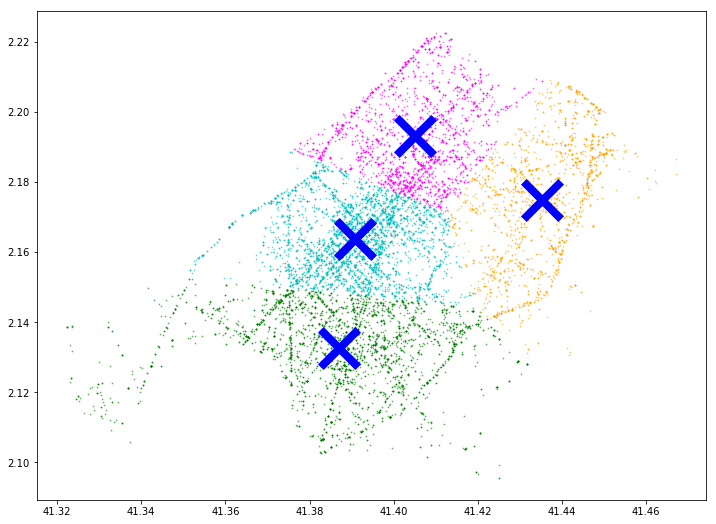

In [234]:
# # Shape of the plot
fig, ax1 = plt.subplots(figsize=(12, 9))

from scipy.spatial import Voronoi, voronoi_plot_2d

# # Plot the data
for k in range(len(X)):
    if X.iloc[k, 2]==0:
        plt.plot(X_array[k, 0], X_array[k, 1], 'k.', markersize=1.5, alpha=0.5,color='magenta') # Datapoints
    if X.iloc[k, 2]==1:
        plt.plot(X_array[k, 0], X_array[k, 1], 'k.', markersize=1.5, alpha=0.5,color='g') # Datapoints
    if X.iloc[k, 2]==2:
        plt.plot(X_array[k, 0], X_array[k, 1], 'k.', markersize=1.5, alpha=0.5,color='c') # Datapoints
    if X.iloc[k, 2]==3:
        plt.plot(X_array[k, 0], X_array[k, 1], 'k.', markersize=1.5, alpha=0.5,color='orange') # Datapoints
# plot_voronoi(kmeans_pred,_range=[-0.5,0.5,-0.5,0.5],sampling=500, clr_map='Set1') #Voronoi plot

# # Get the centroids and plot them
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=1400, linewidth=8, color='b', zorder=100)
plt.scatter(loc_estacions[:, 0], loc_estacions[:, 1], marker='x', s=1400, linewidth=8, color='y', zorder=100)

# # Label the data
plt.xlabel('Latitud', fontsize=18)
plt.ylabel('Longitud', fontsize=18)
plt.title('Cluster visualitzation', fontsize=18)


plt.show()

In [235]:
### SEMAFORS ###
lat_X = X["Latitud"].values.tolist()
long_X = X["Longitud"].values.tolist()

lat_X = np.round(lat_list,7)
long_X =np.round(long_list,7)

# labels = valors_grans["Dist_semaf"].values.tolist() ### NO VA
# labels = np.round(labels,0)

myMap_X = folium.Map(location=[lat_X.mean(),long_X.mean()], zoom_start=12)

for y in range(0,len(lat_X)):
    if X.iloc[y, 2]==0:
        folium.Marker(location=[lat_X[y],long_X[y]], icon=folium.Icon(color='red')).add_to(myMap_X)
    if X.iloc[y, 2]==1:
        folium.Marker(location=[lat_X[y],long_X[y]], icon=folium.Icon(color='darkblue')).add_to(myMap_X)
    if X.iloc[y, 2]==2:
        folium.Marker(location=[lat_X[y],long_X[y]], icon=folium.Icon(color='darkgreen')).add_to(myMap_X)
    if X.iloc[y, 2]==3:
        folium.Marker(location=[lat_X[y],long_X[y]], icon=folium.Icon(color='orange')).add_to(myMap_X)

# myMap2.save('Mapa_semafors_bo.html')
# myMap_X